# 🧠 Convolutional Neural Network

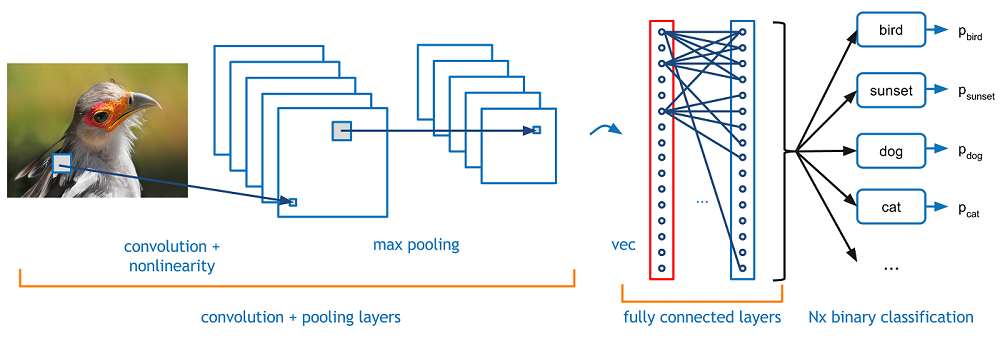


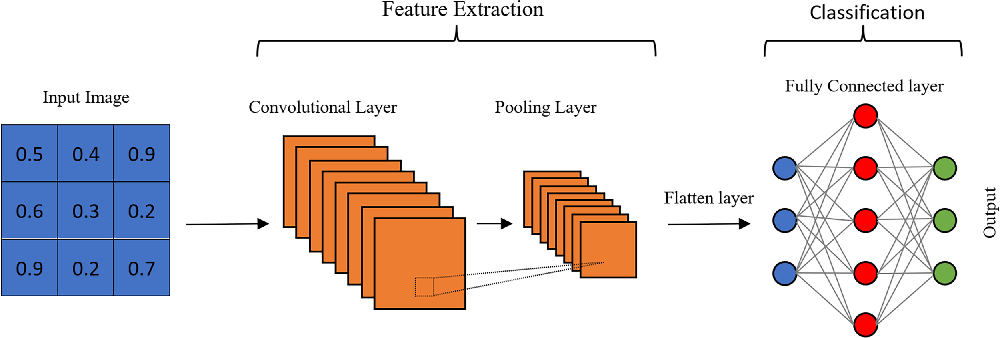

# 🧠 CNN Week
---

## 📌 Overview of the Two Classes

### **Class 1: CNN Basics + MNIST Digit Classification**
- What are Neural Networks?
- Why do we need CNNs for images?
- How CNNs work – layers explained simply
- Implementing a CNN on MNIST
- Visualizing filters and results

### **Class 2: CNN Applications – Beyond Classification**
- Object Detection
- Image Segmentation
- OCR
- Bonus: Transfer Learning, Pretrained Models

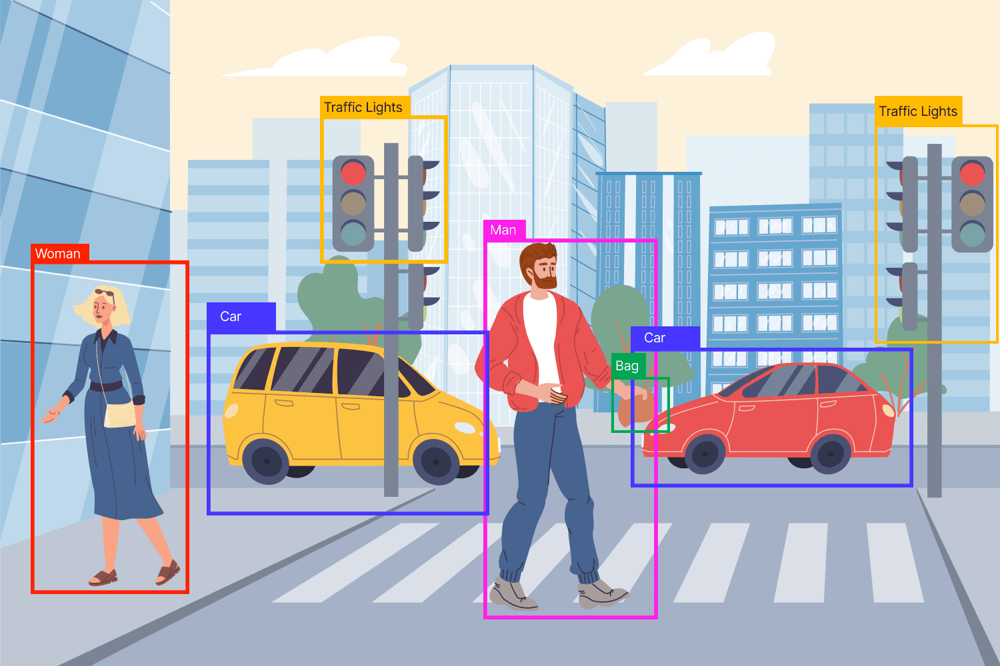


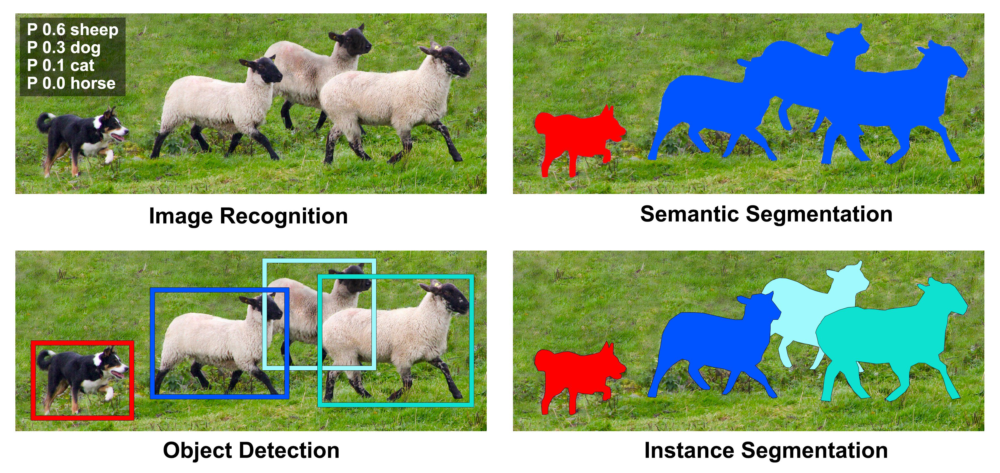



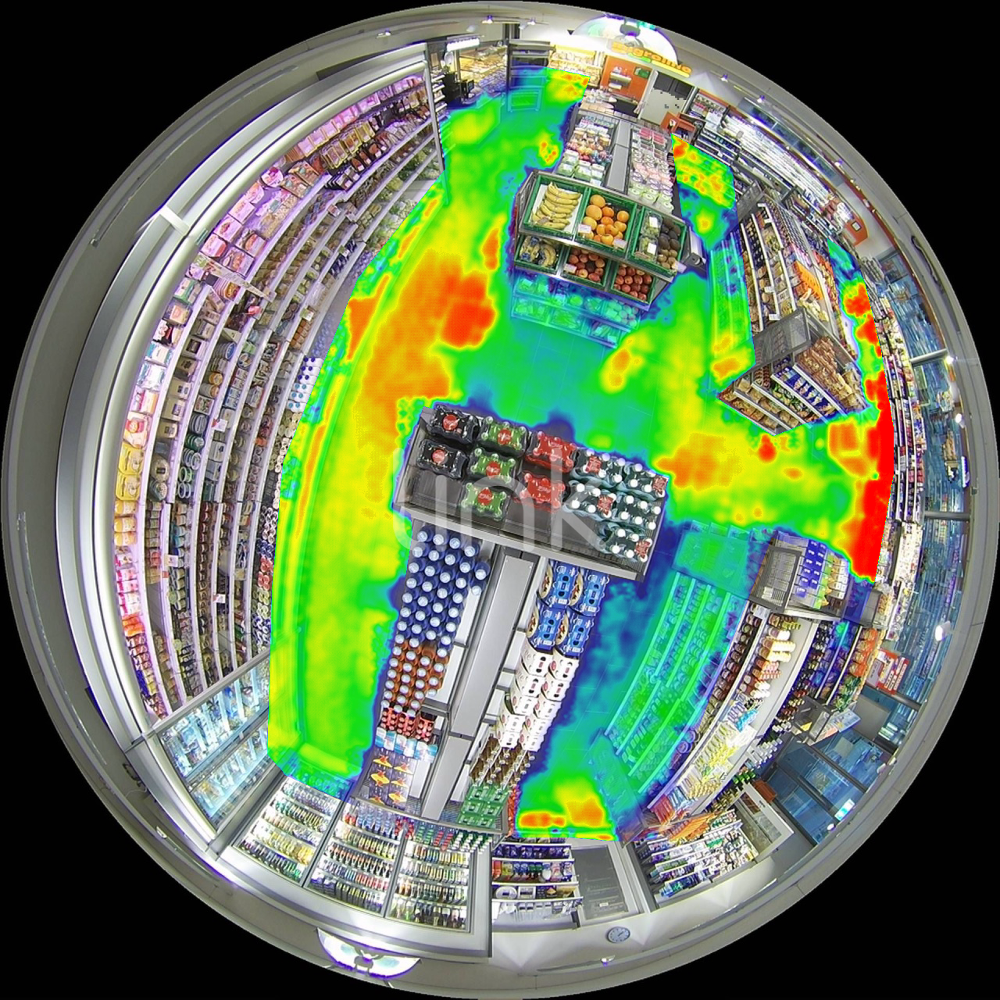
---

# 🔹 Class 1: CNN Basics + MNIST

---

## 🤖 What is a Neural Network?

A **neural network** is a model inspired by the brain:

- **Input Layer**: Takes raw data (like pixel values).
- **Hidden Layers**: Extract and transform features.
- **Output Layer**: Makes predictions.

> Each connection has a **weight**. Training means adjusting these weights to reduce error.

---

## ❓ Why Neural Networks?

Before neural networks, we had to manually engineer features:

- Time-consuming
- Poor generalization
- Not effective for complex patterns

Neural networks **learn features automatically** from data.

---

## 🧠 Example: Classifying a “3”

- Input: 784 pixels (28×28 image)
- Hidden Layer: 128 neurons
- Output: 1 neuron (0 = not 3, 1 = is 3)

Training involves **forward pass + backpropagation** to improve predictions.

---

## 📷 Why Do We Need CNNs?

---

## 🛑 Limitations of Dense Networks for Images

- No spatial awareness – treats every pixel separately
- Huge number of parameters
- Can't recognize edges, shapes, or textures effectively

---

## 🧱 What is a CNN?

A **Convolutional Neural Network (CNN)**:

- Scans small parts of the image using filters (kernels)
- Shares weights – fewer parameters
- Preserves spatial structure

CNNs can detect **edges → shapes → complex objects** layer by layer.

---

## 🔑 Key CNN Components

### 🧩 Convolutional Layer
- Applies filters to learn features like edges and curves
- Outputs a feature map
- Each filter activates for specific patterns

> **Analogy**: A magnifying glass moving across the image.

---

### 🌊 Pooling Layer (e.g., Max Pooling)
- Downsamples feature maps
- Keeps strongest signals
- Reduces spatial size and computation

> **Analogy**: Keeping only the brightest stars in a constellation.

---

### ⚡ Activation Function: ReLU
- Introduces non-linearity
- Helps model learn complex features

```
ReLU(x) = max(0, x)
```

---

### 🪜 Flatten + Fully Connected Layers
- After convolution + pooling, convert 2D features into 1D
- Use dense layers for final classification

---

### 🧯 Dropout and Batch Normalization (Optional)
- **Dropout**: Prevents overfitting by randomly dropping units
- **BatchNorm**: Stabilizes training and improves speed

---

Importing required python modules
1. pandas and numpy for reading csv files and saving the results
2. matplotlib and seaborn for plotting graphs to visualise and make sense of data
3. to_categorical for "one-hot encoding" of labels


**Why?** It helps the network focus only on strong signals.

---

### 🎯 Dropout

- **Turns off** some neurons randomly during training
- Prevents the network from **memorizing** the training data (overfitting)
- Forces the network to learn **robust** patterns

**Analogy**: Like forcing a team to train with different players missing – it makes everyone better overall.

---

## 🔁 Training a CNN

A CNN learns by repeating this cycle:

1. Take a batch of images
2. Predict labels (e.g., "this is an 8")
3. Compare with actual labels
4. Adjust weights to do better next time

Each full pass over all data = **1 epoch**

---




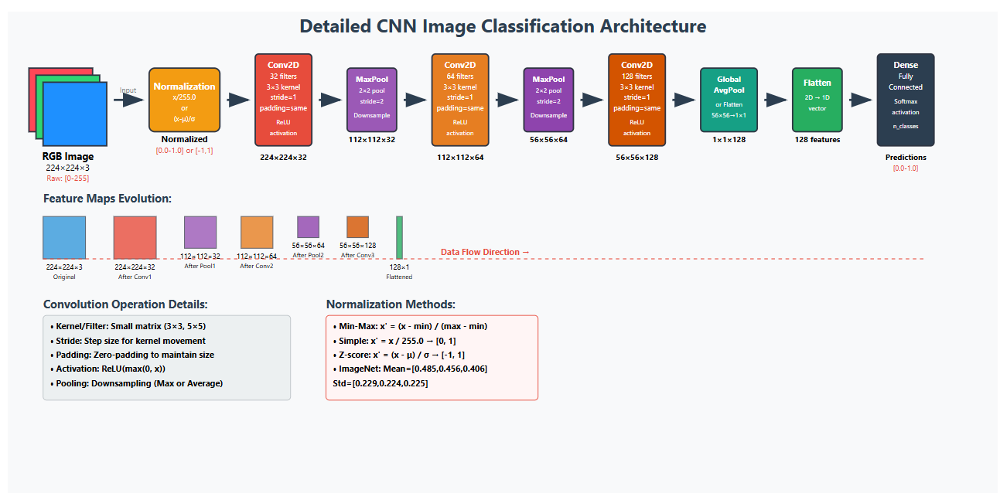

# 🧠 CNN Architecture: Step-by-Step Breakdown (224×224×3 RGB Input)

---

## 📥 Input Image: RGB

- Shape: **224 × 224 × 3**
  - Height = 224
  - Width = 224
  - Channels = 3 (R, G, B)

---

## 🟨 Step 1: Normalization

**Why Normalize?**  
- Converts pixel values from `[0–255]` to `[0–1]` or `[-1, 1]`

**Methods:**
- Simple: `x = x / 255.0`
- Min-Max: `x' = (x - min) / (max - min)`
- Z-score: `x' = (x - μ) / σ`
- ImageNet-style: Mean = [0.485, 0.456, 0.406], Std = [0.229, 0.224, 0.225]

---

## 🟧 Step 2: Conv2D (32 filters, 3×3, stride=1, padding=same)

- Input: **224 × 224 × 3**
- Filters: 32, each of size 3×3×3
- Stride: 1
- Padding: same → output keeps original spatial size

✅ **Output: 224 × 224 × 32**

---

## 🟪 Step 3: Max Pooling (2×2, stride=2)

- Reduces spatial dimensions by half

✅ **Output: 112 × 112 × 32**

---

## 🟧 Step 4: Conv2D (64 filters, 3×3)

✅ **Output: 112 × 112 × 64**

---

## 🟪 Step 5: Max Pooling (2×2, stride=2)

✅ **Output: 56 × 56 × 64**

---

## 🟧 Step 6: Conv2D (128 filters, 3×3)

✅ **Output: 56 × 56 × 128**

---

## 🟩 Step 7: Global Average Pooling

- Averages each 56×56 map into a single value

✅ **Output: 1 × 1 × 128**

---

## 🟩 Step 8: Flatten

- Converts 1×1×128 to 1D vector of length 128

✅ **Output: 128**

---

## 🔵 Step 9: Dense Layer (Fully Connected)

- Fully connected layer with `n_classes` output
- Softmax activation: outputs probabilities

✅ **Output: [0–1] vector of class scores**

---

## ✅ Final Shape Progression Summary

| Step           | Shape             |
|----------------|-------------------|
| Input          | 224 × 224 × 3     |
| Conv1          | 224 × 224 × 32    |
| MaxPool1       | 112 × 112 × 32    |
| Conv2          | 112 × 112 × 64    |
| MaxPool2       | 56 × 56 × 64      |
| Conv3          | 56 × 56 × 128     |
| GlobalAvgPool  | 1 × 1 × 128       |
| Flatten        | 128               |
| Dense          | n_classes         |

---

## 🧮 Formula: Convolution Output Size

Let:
- **W** = Input width/height
- **F** = Filter size (kernel)
- **P** = Padding
- **S** = Stride

**Conv Output Size** (per side):
```
Out = ((W - F + 2P) / S) + 1
```

### Example:
- Input = 224
- Filter = 3
- Padding = 1 (same)
- Stride = 1

```
Out = ((224 - 3 + 2*1) / 1) + 1 = 224
```

---

## 🧮 Formula: MaxPooling Output Size

Same formula applies:
```
Out = ((W - F) / S) + 1
```

### Example:
- Input = 224
- Pool size = 2
- Stride = 2

```
Out = ((224 - 2) / 2) + 1 = 112
```

If you used stride = 4:
```
Out = ((224 - 2) / 4) + 1 = 56.5 → 56
```

---

## ❓ Can I use a 5×5 filter?

✅ Yes! Larger filters:
- See bigger local regions
- Increase parameters and computation
- May be helpful in initial layers (less commonly used now vs stacked 3×3)

---

## ❓ What if MaxPooling had stride = 4?

- Aggressive downsampling
- Example: 112 → ((112 - 2)/4)+1 = 28
- Risk of **losing too much spatial info**

---

## ❓ Why Padding is Needed?

- Without padding, size shrinks after every conv layer
- With padding='same', you preserve size
- Zero-padding adds zeros around borders

📌 Helps retain edge pixels and control output size

---


#CONVOLUTION
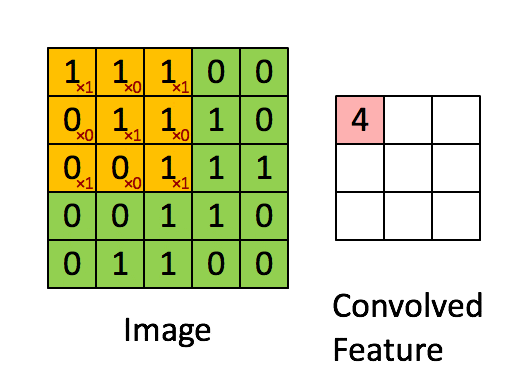

## Convolution


## PADDING =0 , STRIDE=1
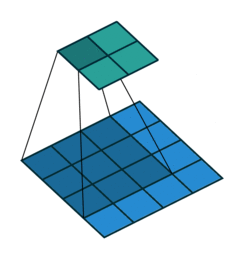




## PADDING = 1 , STRIDE = 1

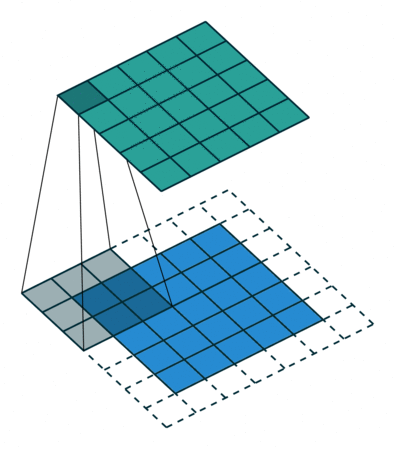

### PADDING =0 , STRIDE = 2
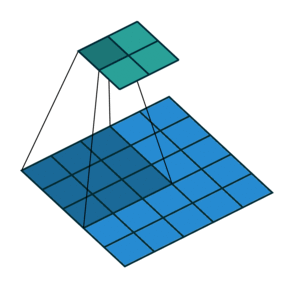

### Padding =1 , Stride = 2

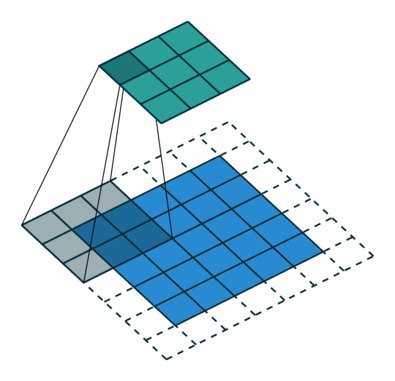

## RGB Concolution

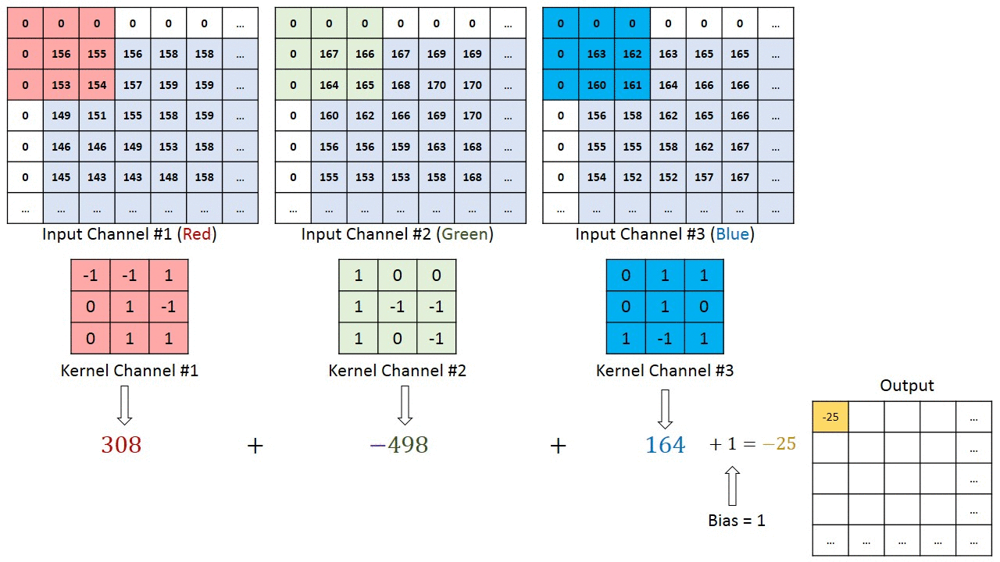

## Max pooling Layer :
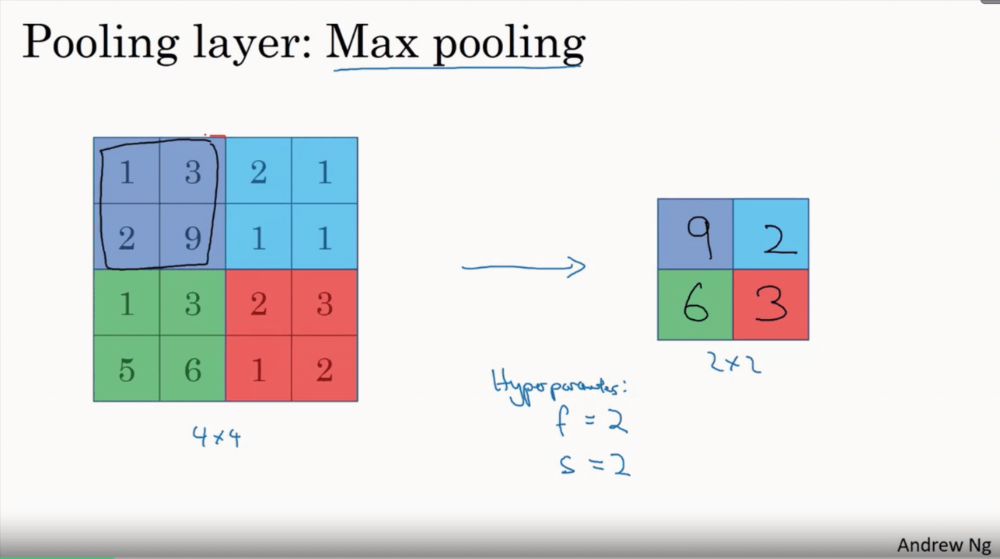

## MAX POOL VS GLOBAL AVG POOL

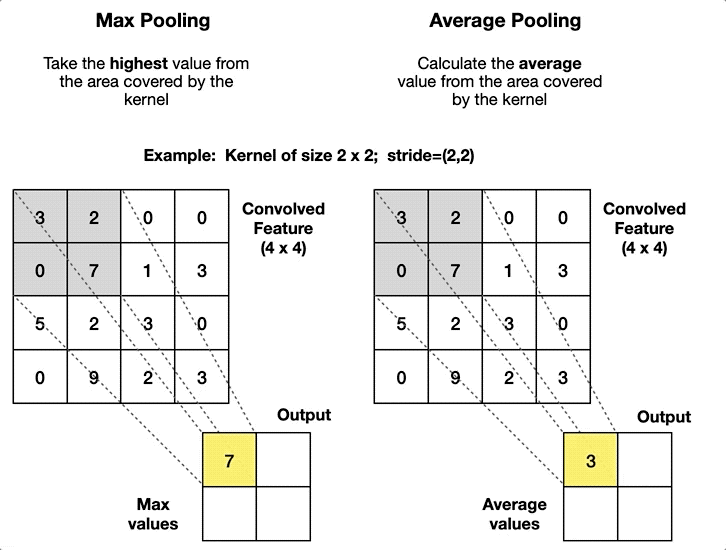

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from keras.utils import to_categorical
%matplotlib inline

Importing data from csv files:
1. train.csv : The training data set, has 785 columns. The first column, called "label", is the digit that was drawn by the user. The rest of the columns contain the pixel-values of the associated image.


Reading train data using pandas.



In [ ]:
data = pd.read_csv("/content/mnist_train.csv")


In [ ]:
data.head()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
0,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
data['label'].value_counts()

,count
label,
1,6742
7,6265
3,6131
2,5958
9,5949
0,5923
6,5918
8,5851
4,5842


In [ ]:
len(data)

60000

In [ ]:
data=data.values

In [ ]:
#Taking labels(first column) out of data.
label = data[:,0]

# Drop 'label' column
data = data[:,1:]

print("Data loaded, ready to go!")

Data loaded, ready to go!


In [ ]:
label

array([5, 0, 4, ..., 5, 6, 8])

In [ ]:
len(data[0])

784

Diving data and label into two parts: train and validation.
We have a separate test.csv file for testing our model predictions

In [ ]:
#splitting data into train and valid
train_data=data[:35000,:]
valid_data=data[35000:,:]

#reshaping to make it in proper input shape for a neural network
train_data = train_data.reshape(train_data.shape[0], 1, 28, 28).astype('float32')
valid_data = valid_data.reshape(valid_data.shape[0], 1, 28, 28).astype('float32')

#normalise data
train_data = train_data / 255
valid_data= valid_data/255

#spliting label into train and valid
train_label = label[:35000]
valid_label = label[35000:]

#one-hot-encoding
#Encode labels to one hot vectors (ex : 2 -> [0,0,1,0,0,0,0,0,0,0])
train_label = to_categorical(train_label)
valid_label = to_categorical(valid_label)

#print shape
print("train_data shape: ",train_data.shape)
print("train_label shape: ",train_label.shape)
print("valid_data shape: ",valid_data.shape)
print("valid_label shape: ",valid_label.shape)

train_data shape:  (35000, 1, 28, 28)
train_label shape:  (35000, 10)
valid_data shape:  (25000, 1, 28, 28)
valid_label shape:  (25000, 10)


Importing modules needed to build model
Keras does provide a lot of capability for creating convolutional neural networks.

In [ ]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras import backend as K
# Set image data format (if needed)
K.set_image_data_format('channels_first')  # Replaces the deprecated set_image_dim_ordering('th')


# fix random seed for reproducibility
seed = 7
np.random.seed(seed)

Define a function to create a model

In [ ]:
# Define a function to create a model
def create_model():
    # create model
    model = Sequential()
    # Explicitly set data_format to 'channels_first' for Conv2D and MaxPooling2D
    model.add(Conv2D(32, (5, 5), input_shape=(1, 28, 28), activation='relu', data_format='channels_first'))
    model.add(MaxPooling2D(pool_size=(2, 2), data_format='channels_first'))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10, activation='softmax'))
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


In [ ]:
# 32*12*12 -> Flatten ( ) ->  [ ...........................]4068 -> 256 Neuron -> 64 ->32 ->


# 🧠 CNN Model for MNIST (Grayscale 28×28)

## 🏗️ Model Explanation (Grayscale)

### Input:
- `input_shape=(1, 28, 28)` → Channels First
  - 1 channel (grayscale)
  - 28x28 pixels

### Layers:
1. **Conv2D(32, (5×5))**  
   - 32 filters of size 5×5  
   - Output shape: `(32, 24, 24)` (without padding)

2. **MaxPooling2D(2×2)**  
   - Downsamples to `(32, 12, 12)`

3. **Dropout(0.2)**  
   - Prevents overfitting by randomly disabling neurons

4. **Flatten()**  
   - Converts `(32, 12, 12)` → `4608` (1D)

5. **Dense(128)**  
   - Fully connected layer

6. **Dense(10)**  
   - Output layer for 10 digit classes (softmax)

In [ ]:
## CODE FOR 3 Channel Image
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

def create_rgb_model():
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3), activation='relu'))  # No need for data_format
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(10, activation='softmax'))  # Assume 10 classes
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

✅ Tip:
- For grayscale: `input_shape=(1, 28, 28)` → `channels_first`
- For RGB: `input_shape=(224, 224, 3)` → `channels_last` (default in Keras)


Passing training and validation data along with labels to model

In [ ]:
# build the model
model = create_model()
# Fit the model
model.fit(train_data, train_label, validation_data=(valid_data, valid_label), epochs=10, batch_size=200, verbose=2)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
175/175 - 6s - 35ms/step - accuracy: 0.9063 - loss: 0.3234 - val_accuracy: 0.9638 - val_loss: 0.1213
Epoch 2/10
175/175 - 1s - 6ms/step - accuracy: 0.9738 - loss: 0.0925 - val_accuracy: 0.9763 - val_loss: 0.0792
Epoch 3/10
175/175 - 1s - 5ms/step - accuracy: 0.9811 - loss: 0.0626 - val_accuracy: 0.9810 - val_loss: 0.0634
Epoch 4/10
175/175 - 1s - 7ms/step - accuracy: 0.9853 - loss: 0.0480 - val_accuracy: 0.9822 - val_loss: 0.0612
Epoch 5/10
175/175 - 1s - 7ms/step - accuracy: 0.9874 - loss: 0.0404 - val_accuracy: 0.9841 - val_loss: 0.0547
Epoch 6/10
175/175 - 1s - 5ms/step - accuracy: 0.9901 - loss: 0.0312 - val_accuracy: 0.9822 - val_loss: 0.0578
Epoch 7/10
175/175 - 1s - 6ms/step - accuracy: 0.9925 - loss: 0.0255 - val_accuracy: 0.9858 - val_loss: 0.0504
Epoch 8/10
175/175 - 1s - 7ms/step - accuracy: 0.9927 - loss: 0.0228 - val_accuracy: 0.9824 - val_loss: 0.0600
Epoch 9/10
175/175 - 1s - 6ms/step - accuracy: 0.9946 - loss: 0.0179 - val_accuracy: 0.9849 - val_loss: 0.0529


In [ ]:
# Final evaluation of the model
scores = model.evaluate(valid_data, valid_label, verbose=0)
print("CNN Error: %.2f%%" % (100-scores[1]*100))

CNN Error: 1.60%


Exciting! we have trained our model
Saving model weights for later use

In [ ]:
# model.save("model.h5")
# print("model weights saved in model.h5 file")
model.save("model.keras", save_format="keras")  # NOT HDF5 .h5 format

In [ ]:
# prompt: /content/mnist_test.csv
# load test data do all step and get accuracy of model

# load test data
test_data = pd.read_csv("/content/mnist_test.csv").values

# Take labels out of data.
test_label = test_data[:,0]

# Drop 'label' column
test_data = test_data[:,1:]

# Reshape and normalize test data
test_data = test_data.reshape(test_data.shape[0], 1, 28, 28).astype('float32')
test_data = test_data / 255

# One-hot-encode test labels
test_label = to_categorical(test_label)

print("Test data loaded, ready to go!")
print("test_data shape: ", test_data.shape)
print("test_label shape: ", test_label.shape)

# Evaluate the model on the test data
scores = model.evaluate(test_data, test_label, verbose=0)
print("Accuracy on test data: %.2f%%" % (scores[1]*100))
print("Test loss: %.2f" % (scores[0]))

Test data loaded, ready to go!
test_data shape:  (10000, 1, 28, 28)
test_label shape:  (10000, 10)
Accuracy on test data: 98.88%
Test loss: 0.04


# 📌 Neural Networks & CNNs: Use Cases and Limitations

---

## 🧠 Use Cases of Neural Networks

Neural networks are powerful tools for tasks that involve pattern recognition and decision-making. Some common applications include:

### ✅ General Neural Network Use Cases

- **Handwritten Digit Recognition** (e.g., MNIST dataset)
- **Spam Detection** in emails
- **Stock Market Prediction**
- **Voice Recognition** (e.g., Siri, Alexa)
- **Credit Scoring** and fraud detection
- **Recommendation Systems** (e.g., Netflix, Amazon)
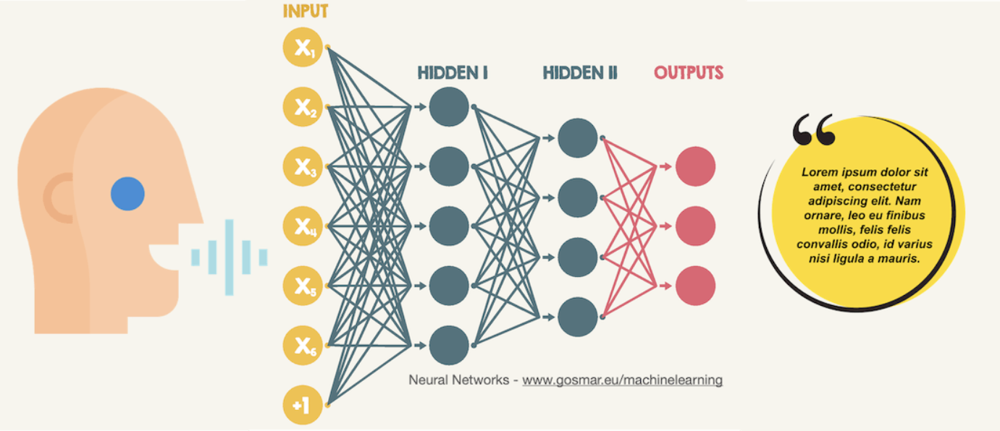
---

## 🖼️ Use Cases of CNNs (Convolutional Neural Networks)

CNNs are especially designed for visual and spatial data. They are widely used in:

### ✅ CNN-Specific Applications

- **Image Classification** (e.g., cats vs dogs, digit recognition)
- **Object Detection** (e.g., face detection, pedestrian detection)
- **Medical Imaging** (e.g., tumor detection in X-rays, MRIs)
- **Autonomous Vehicles** (e.g., traffic sign and lane recognition)
- **Facial Recognition** (e.g., security systems)
- **Document Digitization** (e.g., converting scanned forms to text)

---

## ⚠️ Limitations of Neural Networks

While neural networks are powerful, they also have limitations:

### ❌ Neural Network Limitations

- Require **large datasets** for good performance
- Can be **computationally expensive** (need GPUs/TPUs)
- Are often **black boxes** (hard to interpret how they make decisions)
- Prone to **overfitting** if not regularized
- Can struggle with **spatial relationships** in data (e.g., in images)

---

## ⚠️ Limitations of CNNs

CNNs overcome many neural network limitations for images, but they still have some downsides:

### ❌ CNN Limitations

- Still require **a lot of labeled data**
- Can be **sensitive to rotations and scale changes** in images
- Need **significant compute power** (especially for deep networks)
- May not perform well on **non-image tasks** without customization
- Difficult to understand what exactly each filter is learning

---

## 🧠 Summary Table

| Model Type      | Best For                      | Key Limitation                              |
|------------------|-------------------------------|-----------------------------------------------|
| **Neural Network** | Tabular data, audio, sequences | Ignores spatial info, needs a lot of data     |
| **CNN**            | Images and visual tasks        | Sensitive to scale/rotation, needs GPU power  |

---
